# Quão popular é o Presidente?
> "Experimentos com Gaussian Process para modelar a dinâmica da popularidde ao longo do tempo"

- toc: true
- badges: true
- comments: true
- author: Daniel Marcelino
- categories: [popularidade, Bolsonaro, Gaussian processes, pesquisas de opinião]
- image: ../figures/gp-popularity.png

## Mostre me os dados!

In [1]:
import sys
try:
    import warnings                                                   
    warnings.filterwarnings('ignore')
    import arviz as az
    import matplotlib.pyplot as plt
    import pandas as pd       
    import numpy as np
    import pymc3 as pm
    import xarray as xr
    import os
    import sqlite3
    import io
    import datetime
    import csv
    import watermark
    # import Quandl
    from IPython.display import display, HTML
    from dateutil.relativedelta import relativedelta
    from scipy.special import expit as logistic
    from matplotlib import dates

except ImportError:
    print("Error: missing one of the libraries..")
    sys.exit()
    
%pylab inline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# hide
RANDOM_SEED = 2021
np.random.seed(RANDOM_SEED)
az.style.use("arviz-darkgrid")
pd.options.display.float_format = '{:.2f}'.format

print('Running on PyMC3 v{}'.format(pm.__version__))
print('Running on arviz v{}'.format(az.__version__))
print(os.getcwd())
print(sys.argv[0])

Populating the interactive namespace from numpy and matplotlib
Running on PyMC3 v3.11.2
Running on arviz v0.11.2
/Users/marcelino/dmarcelinobr/pollbase/dashboards/models
/Users/marcelino/miniconda3/envs/polls/lib/python3.9/site-packages/ipykernel_launcher.py


In [2]:
con = sqlite3.connect('../../pollingpoint.db')

all_presidents = pd.read_sql(""" SELECT 
data_fim, empresa, positiva, regular, negativa, amostra, erro, nsnr, presidente, modo 
FROM aprovacao WHERE tipo = "Avaliação do governo federal"
ORDER BY data_fim; """, con=con) 

con.close()

# Converte para datetime 
all_presidents["data_fim"] = pd.to_datetime(all_presidents["data_fim"])

# Correct a few typos in the dataset
all_presidents["modo"] = all_presidents["modo"].replace("Online", "Internet")
all_presidents["modo"] = all_presidents["modo"].replace("FF", "Presencial")
all_presidents["presidente"] = all_presidents["presidente"].replace("Dilma Rousseff II", "Dilma/Temer")
all_presidents["presidente"] = all_presidents["presidente"].replace("Michel Temer", "Dilma/Temer")

# Replace NA with 1000 interviews 
all_presidents["amostra"] = all_presidents["amostra"].replace(np.nan, 1000)
all_presidents["amostra"] = all_presidents["amostra"].astype("int") 

# Index by field date
all_presidents.set_index("data_fim", inplace=True)

# restrict data to after Franco's term
all_presidents = all_presidents.loc[all_presidents.index >= pd.to_datetime("1995-01-01")]

# Convert approvals rates to proportion and compute total num approval
all_presidents[["positiva", "regular", "negativa"]] = ( 
    all_presidents[["positiva", "regular", "negativa"]].copy() / 100
)

# raw monthly average to get fixed time intervals
# TODO: replace by poll aggregation
df = all_presidents.groupby("presidente").resample("M").mean().reset_index(level=0).sort_index()

# Forward-Fill
df["amostra"] = df.groupby(["presidente"])["amostra"].transform(lambda x: x.fillna(method='ffill'))
df["positiva"] = df.groupby(["presidente"])["positiva"].transform(lambda x: x.fillna(method='ffill'))
df["regular"] = df.groupby(["presidente"])["regular"].transform(lambda x: x.fillna(method='ffill'))
df["negativa"] = df.groupby(["presidente"])["negativa"].transform(lambda x: x.fillna(method='ffill'))
df["nsnr"] = df.groupby(["presidente"])["nsnr"].transform(lambda x: x.fillna(method='ffill'))
df["erro"] = df.groupby(["presidente"])["erro"].transform(lambda x: x.fillna(method='ffill'))

# convert to nbr of successes
df["positiva_int"] = np.floor(df["amostra"] * df["positiva"]).astype("int")
df["negativa_int"] = np.floor(df["amostra"] * df["negativa"]).astype("int")

# compute total trials
df["total_int"] = df.positiva_int + df.negativa_int

# Reset the index
df = df.reset_index().rename(columns={"data_fim": "index"})

# index by data
df.set_index("index", inplace=True)

# hide
def governo(data):
    data = data.date()
    if data >= datetime.date(1995, 1, 1) and data <= datetime.date(1998, 12, 31):
        return 'FHC 1'
    elif data >= datetime.date(1999, 1, 1) and data <= datetime.date(2002, 12, 31):
        return 'FHC 2'
    elif data >= datetime.date(2003, 1, 1) and data <= datetime.date(2006, 12, 31):
        return 'LULA 1'
    elif data >= datetime.date(2007, 1, 1) and data <= datetime.date(2010, 12, 31):
        return 'LULA 2'
    elif data >= datetime.date(2011, 1, 1) and data <= datetime.date(2014, 12, 31):
        return 'DILMA 1'
    elif data >= datetime.date(2015, 1, 1) and data < datetime.date(2016, 5, 12):
        return 'DILMA 2'
    elif data >= datetime.date(2016, 5, 12) and data <= datetime.date(2016, 12, 31):
        return 'TEMER'
    elif data >= datetime.date(2019, 1, 1) and data <= datetime.date(2022, 12, 31):
        return 'BOLSONARO'
    else:
        return None

df['governo'] = df.index.map(governo)


# hide
BLOCOS = {
    "Fernando Henrique I": "left",
    "Fernando Henrique II": "right",
    "Lula da Silva I": "left",
    "Lula da Silva II": "left",
    "Dilma Rousseff I": "left",
    "Dilma/Temer": "left",
    "Jair Bolsonaro": "right",
}


df["bloco"] = df.presidente.replace(BLOCOS)

MANDATO_FLAGS = (
    (df.index.year == 1995) & (df.index.month == 1)
    | (df.index.year == 1999) & (df.index.month == 1)
    | (df.index.year == 2003) & (df.index.month == 1)
    | (df.index.year == 2007) & (df.index.month == 1)
    | (df.index.year == 2011) & (df.index.month == 1)
    | (df.index.year == 2015) & (df.index.month == 1)
    | (df.index.year == 2019) & (df.index.month == 1)
)
df["mandato"] = 0

df.loc[MANDATO_FLAGS, "mandato"] = 1


ELEICOES_FLAGS = (
    (df.index.year == 1994) & (df.index.month == 10)
    | (df.index.year == 1998) & (df.index.month == 10)
    | (df.index.year == 2002) & (df.index.month == 10)
    | (df.index.year == 2006) & (df.index.month == 10)
    | (df.index.year == 2010) & (df.index.month == 10)
    | (df.index.year == 2014) & (df.index.month == 10)
    | (df.index.year == 2018) & (df.index.month == 10)
)
df["eleicao"] = 0

df.loc[ELEICOES_FLAGS, "eleicao"] = 1

In [3]:
def dif_mes(d1, d2):
    return d1.date().month - d2.date().month + (d1.date().year - d2.date().year) * 12


def fill_desemprego(x):
    if np.isnan(x['desocupacao']):
        return x['pme']
    else:
        return x['desocupacao']
    

def ipca_taxa_mensal(
        ipca: float):
        """
        Monthly Inflation Rate
        """
        return ((ipca/ipca.shift(1))-1)*100

def ipca_taxa_anual(
        ipca: float):
        """
        Annual Inflation Rate
        """
        return ((ipca/ipca.shift(12))-1)*100
    

def cambio_taxa_mensal(
        cambio: float):
        """
        Monthly Exchange Rate
        """
        return ((cambio/cambio.shift(1))-1)*100


    
def pib_taxa_mensal(
        pib: float):
        """
        Monthly GDP Rate
        """
        return ((pib/pib.shift(1))-1)*100
    
def pib_taxa_anual(
        pib: float):
        """
        Annual GDP Rate
        """
        return ((pib/pib.shift(12))-1)*100
    
   

 # Funções para embelezar x-axis dos gráficos    
class OffsetYearLocator(dates.YearLocator):
    def __init__(self, *args, **kwargs):
        self.offset = kwargs.pop("offset", 0)
        dates.YearLocator.__init__(self,*args, **kwargs)
    def tick_values(self, vmin, vmax):
        ymin = self.base.le(vmin.year) * self.base.step - self.offset
        ymax = self.base.ge(vmax.year) * self.base.step + (self.base.step-self.offset)
        ticks = [vmin.replace(year=ymin, **self.replaced)]
        while True:
            dt = ticks[-1]
            if dt.year >= ymax:
                return dates.date2num(ticks)
            year = dt.year + self.base.step
            ticks.append(dt.replace(year=year, **self.replaced))

def format_xaxis(ax):

    years = dates.YearLocator(10,month=1,day=1)
    years1=OffsetYearLocator(2,month=1,day=1, offset=1)
    dfmt = dates.DateFormatter('%Y')
    dfmt1 = dates.DateFormatter('%y')

    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_minor_locator(years1)
    ax.xaxis.set_major_formatter(dfmt)
    ax.xaxis.set_minor_formatter(dfmt1)
    ax.get_xaxis().set_tick_params(which='major', pad=15)

In [4]:
# hide
fields = ['data', 'ipca', 'igp', 'igpm', 'divida_publica', 'cambio', 'pib', 'pme', 'desocupacao', 'salario_real', 'epu']

fundamentos = pd.read_csv(
    "../data/dados_fundamentos.csv",
    sep=",",
    skipinitialspace=True, 
    usecols=fields)

fundamentos["data"] = pd.to_datetime(fundamentos["data"])

fundamentos = fundamentos.sort_values("data")

# as timestamps variables:
fundamentos.index = pd.period_range(start=fundamentos.data.iloc[0], periods=len(fundamentos), freq="M")

fundamentos = fundamentos.drop("data", axis=1)

fundamentos = fundamentos.loc[fundamentos.index >= '1993-12'] 

fundamentos["cambio_var_mensal"] = cambio_taxa_mensal(fundamentos["cambio"]).round(2)

fundamentos["cambio_lag"] = fundamentos["cambio"].shift(1) 

fundamentos["ipca_mes"] = fundamentos["ipca"].diff()

fundamentos["ipca_var_mensal"] = ipca_taxa_mensal(fundamentos["ipca"]).round(2)

fundamentos["ipca_var_anual"] = ipca_taxa_anual(fundamentos["ipca"]).round(2)

fundamentos["Inflacao_acumulada"] = fundamentos["ipca_var_mensal"].cumsum().round(2)
    
fundamentos["pib_var_mensal"] = pib_taxa_mensal(fundamentos["pib"]).round(2)

fundamentos["pib_var_anual"] = pib_taxa_anual(fundamentos["pib"]).round(2)

fundamentos['ipca_no_ano'] = fundamentos.groupby(by=fundamentos.index.year)['ipca_var_mensal'].transform(lambda x: x.cumsum()).round(2)

fundamentos['pib_no_ano'] = fundamentos.groupby(by=fundamentos.index.year)['pib_var_mensal'].transform(lambda x: x.cumsum()).round(2)

fundamentos["cambio_defl"] = (1 + fundamentos["cambio"])/(1 + fundamentos["ipca_var_mensal"]/100) - 1

mean_desemprego = fundamentos["desocupacao"].mean()

fundamentos['desocupacao'] = fundamentos.apply(lambda x : fill_desemprego(x),axis=1)

# don't do it
fundamentos["desocupacao"] = fundamentos["desocupacao"].replace(np.nan, mean_desemprego)

# add quarters to main dataframe:
df = df.reset_index()
df.index = pd.DatetimeIndex(df["index"].values).to_period("M")
df.index.name = "mensal"


# merge with unemployment:
df = df.join(fundamentos).reset_index().set_index("index")
df.index.name = "mes"

df["desocupacao"] = df.desocupacao.fillna(method="ffill")
df["pib_var_mensal"] = df.pib_var_mensal.fillna(method="ffill")
df["pib_var_anual"] = df.pib_var_anual.fillna(method="ffill")
df["ipca"] = df.ipca.fillna(method="ffill")
df["ipca_mes"] = df.ipca_mes.fillna(method="ffill")
df["ipca_var_mensal"] = df.ipca_var_mensal.fillna(method="ffill")
df["ipca_var_anual"] = df.ipca_var_anual.fillna(method="ffill")
df["ipca_no_ano"] = df.ipca_no_ano.fillna(method="ffill")
df["pib_no_ano"] = df.pib_no_ano.fillna(method="ffill")
df["igp"] = df.igp.fillna(method="ffill")
df["igpm"] = df.igpm.fillna(method="ffill")
df["pib"] = df.pib.fillna(method="ffill")
df["cambio"] = df.cambio.fillna(method="ffill")
df["cambio_defl"] = df.cambio_defl.fillna(method="ffill")
df["epu"] = df.epu.fillna(method="ffill")
df["divida_publica"] = df.divida_publica.fillna(method="ffill")
df["salario_real"] = df.salario_real.fillna(method="ffill")


display(HTML(fundamentos.to_html()))


# df.to_csv("../data/complete_popularity_data.csv")

,epu,ipca,igp,igpm,divida_publica,cambio,pib,pme,desocupacao,salario_real,cambio_var_mensal,cambio_lag,ipca_mes,ipca_var_mensal,ipca_var_anual,Inflacao_acumulada,pib_var_mensal,pib_var_anual,ipca_no_ano,pib_no_ano,cambio_defl
1993-12,143.66,100.00,7.98,NaN,32.56,0.10,3534.90,6.80,6.80,506.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1994-01,104.13,141.31,11.10,NaN,32.31,0.14,4562.80,NaN,10.49,627.97,40.00,0.10,41.31,41.31,NaN,41.31,29.08,NaN,41.31,29.08,-0.19
1994-02,158.28,198.22,15.62,NaN,32.00,0.20,5793.00,NaN,10.49,581.88,42.86,0.14,56.91,40.27,NaN,81.58,26.96,NaN,81.58,56.04,-0.14
1994-03,107.25,282.96,22.76,NaN,32.70,0.28,8520.40,NaN,10.49,477.60,40.00,0.20,84.74,42.75,NaN,124.33,47.08,NaN,124.33,103.12,-0.10
1994-04,110.32,403.73,32.07,NaN,33.22,0.40,12828.80,NaN,10.49,475.45,42.86,0.28,120.77,42.68,NaN,167.01,50.57,NaN,167.01,153.69,-0.02
1994-05,122.61,581.49,45.73,NaN,33.58,0.58,20504.20,NaN,10.49,479.12,45.00,0.40,177.76,44.03,NaN,211.04,59.83,NaN,211.04,213.52,0.10
1994-06,113.00,857.29,66.41,NaN,33.12,0.84,33126.60,NaN,10.49,463.75,44.83,0.58,275.80,47.43,NaN,258.47,61.56,NaN,258.47,275.08,0.25
1994-07,75.22,915.93,92.97,NaN,32.82,0.93,40788.00,NaN,10.49,422.36,10.71,0.84,58.64,6.84,NaN,265.31,23.13,NaN,265.31,298.21,0.81
1994-08,63.98,932.97,100.00,NaN,31.61,0.90,43873.40,NaN,10.49,414.69,-3.23,0.93,17.04,1.86,NaN,267.17,7.56,NaN,267.17,305.77,0.87
1994-09,39.37,947.24,101.75,1.75,30.63,0.87,43836.20,NaN,10.49,441.85,-3.33,0.90,14.27,1.53,NaN,268.70,-0.08,NaN,268.70,305.69,0.84


In [5]:
def dates_to_idx(timelist):
    """Convert datetimes to numbers in reference to a given date"""

    reference_time = timelist[0]
    t = (timelist - reference_time) / np.timedelta64(1, "M")

    return np.asarray(t)



def standardize(series):
    """Standardize a pandas series"""
    return (series - series.mean()) / series.std()



tempo_ref = dates_to_idx(df.index)
tempo_ref[:10]

array([0.        , 0.91993675, 1.93843816, 2.92408468, 3.94258609,
       4.92823261, 5.94673402, 6.96523543, 7.95088195, 8.96938335])

# Construção do modelo 

In [6]:
COORDS = {"temporal": df.index}

with pm.Model(coords=COORDS) as desocupacao_latent_gp:
    # intercept on logit scale
    baseline = pm.Normal("baseline", -0.7, 0.5)

    # honeymoon slope
    lua_de_mel = pm.Normal("lua_de_mel", -0.5, 0.3)

    # log cambio slope
    log_desocupacao = pm.Normal("log_desocupacao", 0.0, 0.1)

    # long term trend
    amplitude = pm.HalfNormal("amplitude", 0.8)
    tendencia = pm.Gamma("tendencia", alpha=4, beta=2)
    cov_tendencia = amplitude ** 2 * pm.gp.cov.Matern52(1, tendencia)

    # instantiate gp
    gp = pm.gp.Latent(cov_func = cov_tendencia)
    
    # evaluate GP at time points
    gp_tempo = gp.prior("gp_tempo", X=tempo_ref[:, None])

    # data
    mandato = pm.Data("mandato", df.mandato.values, dims="temporal")
    
    stdz_log_desocupacao = pm.Data(
        "stdz_log_desocupacao",
        standardize(np.log(df.desocupacao)).values,
        dims="temporal",
    )
    
    # unemployment data is uncertain
    # sd = 0.1 says uncertainty on point expected btw 20% of data std 95% of time
    delta_desocupacao = pm.Normal("delta_desocupacao", mu=0.0, sigma=0.1, dims="temporal")
    delta_incerteza = stdz_log_desocupacao + delta_desocupacao

    # overdispersion parameter
    theta = pm.Exponential("theta_dispersao", 1.0) + 10.0

    p = pm.Deterministic(
        "popularidade",
        pm.math.invlogit(
            baseline + gp_tempo + lua_de_mel * mandato + log_desocupacao * delta_incerteza
        ),
        dims="temporal",
    )
    
    y = pm.BetaBinomial(
        "observada",
        alpha=p * theta,
        beta=(1.0 - p) * theta,
        n=df.amostra,
        observed=df.positiva_int,
        dims="temporal",
    )

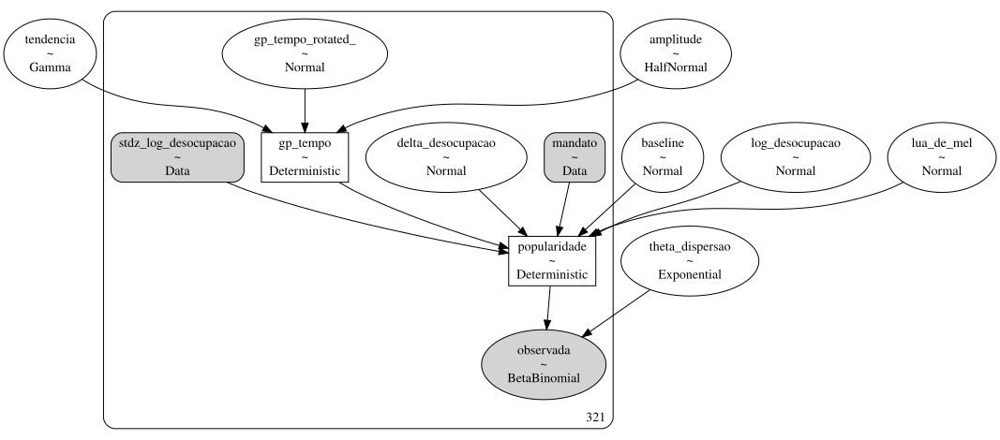

In [7]:
# conda install python-graphviz -n polls
ph = pm.model_to_graphviz(desocupacao_latent_gp)
ph.render("../figures/desocupacao_latent_gp", format="png")

pm.model_to_graphviz(desocupacao_latent_gp)

In [8]:
CHAINS = 8
SEED = 12345
DRAWS = 2000

SAMPLE_KWARGS = {
    'tune': DRAWS//2,
    'draws': DRAWS,
    'cores': CHAINS,
    'chains': CHAINS,
    'random_seed': [SEED + i for i in range(CHAINS)],
    'return_inferencedata': True,
    'target_accept':0.95,
    'idata_kwargs':{
            "dims":{"gp_tempo": ["temporal"], "gp_tempo_rotated_": ["temporal"]}
    }
}


with desocupacao_latent_gp:
     # Explore and Sample the Parameter Space
    trace_desocupacao = pm.sample(**SAMPLE_KWARGS)
    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [theta_dispersao, delta_desocupacao, gp_tempo_rotated_, tendencia, amplitude, log_desocupacao, lua_de_mel, baseline]


Sampling 8 chains for 1_000 tune and 2_000 draw iterations (8_000 + 16_000 draws total) took 13578 seconds.


0, dim: temporal, 321 =? 321


## Diagnosticando o modelo -- O que você está sentindo?

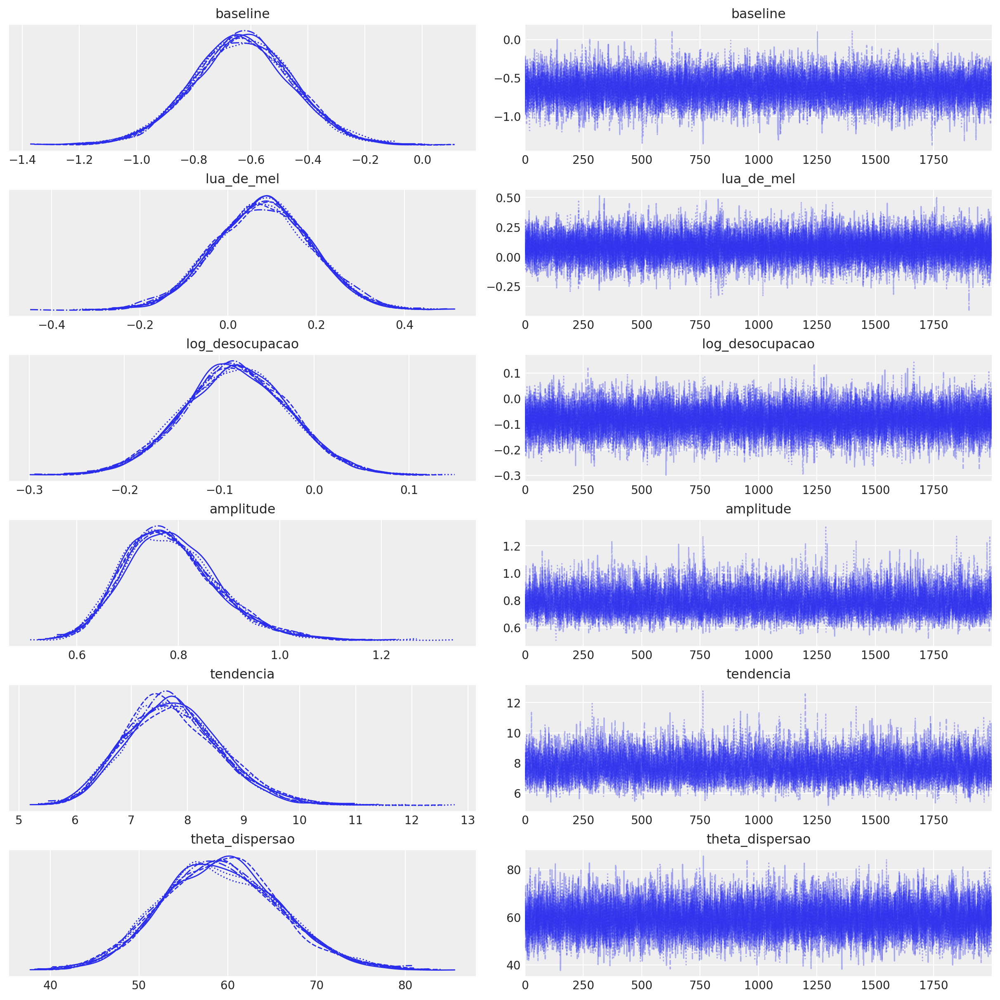

In [9]:
az.plot_trace(
    trace_desocupacao, compact=True, var_names=["~delta_desocupacao", "~popularidade", "~gp_tempo", "~gp_tempo_rotated_"]
);

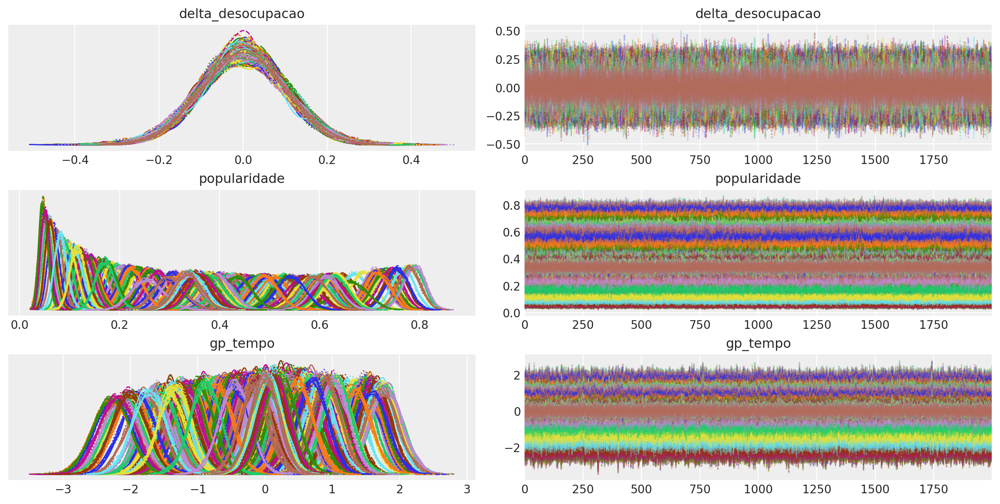

In [10]:
az.plot_trace(
    trace_desocupacao,
    var_names=["delta_desocupacao", "popularidade", "gp_tempo"],
    compact=True,
    coords={"temporal": trace_desocupacao.observed_data.temporal[:300]},
);

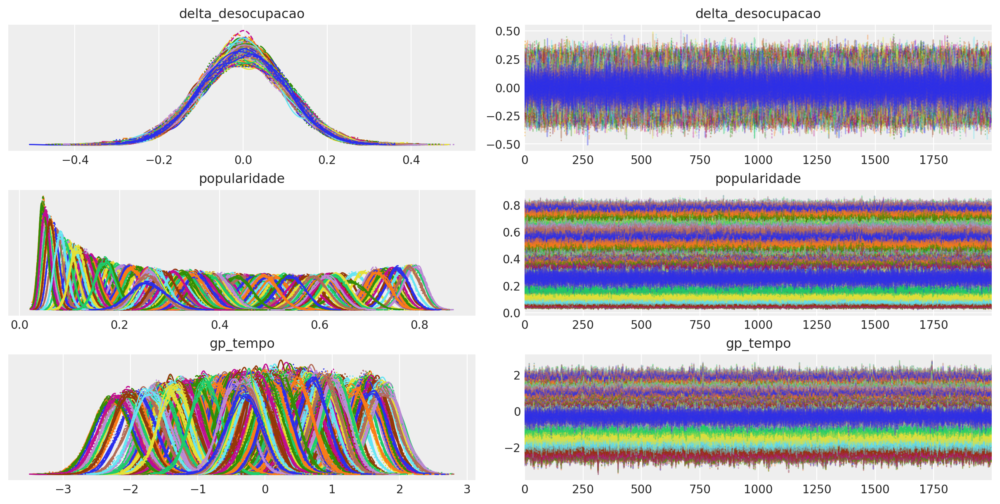

In [11]:
# hide
az.plot_trace(
    trace_desocupacao,
    var_names=["delta_desocupacao", "popularidade", "gp_tempo"],
    compact=True,
    coords={"temporal": trace_desocupacao.observed_data.temporal[50:]},
);

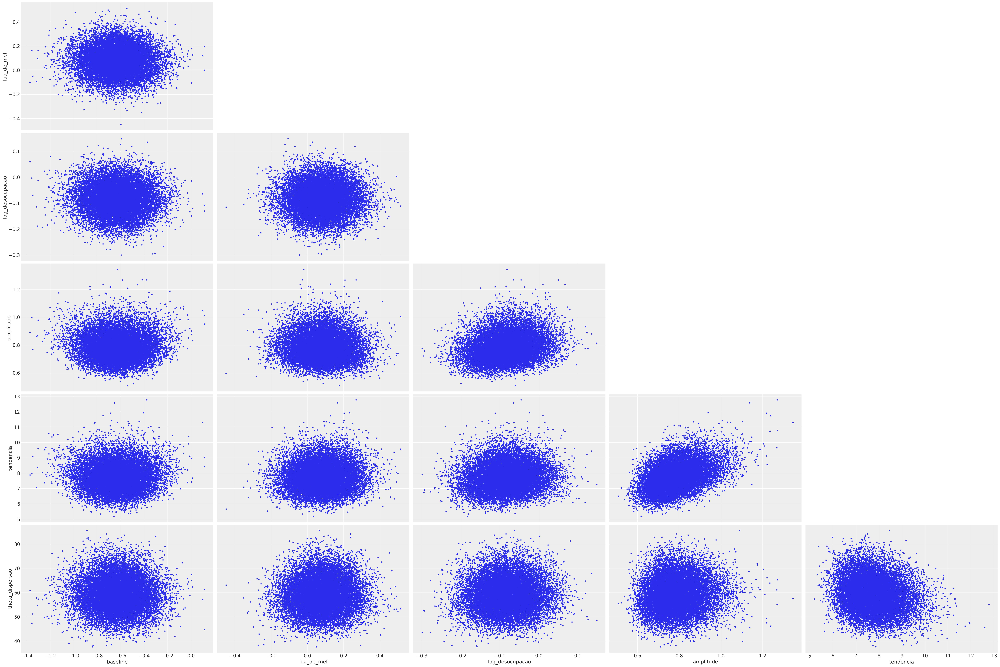

In [12]:
az.plot_pair(
    trace_desocupacao,
    var_names=["~delta_desocupacao", "~popularidade", "~gp_tempo", "~gp_tempo_rotated_"],
    divergences=True,
);

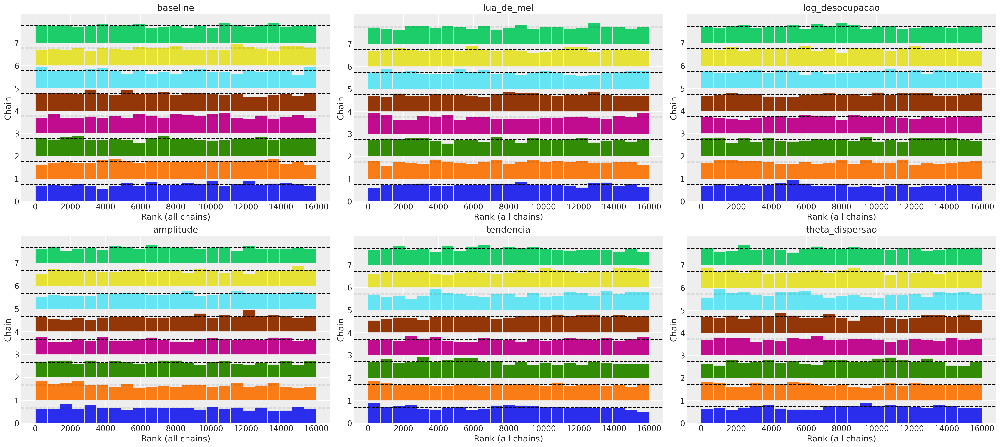

In [13]:
az.plot_rank(trace_desocupacao, var_names=["~delta_desocupacao", "~popularidade", "~gp_tempo", "~gp_tempo_rotated_"]);

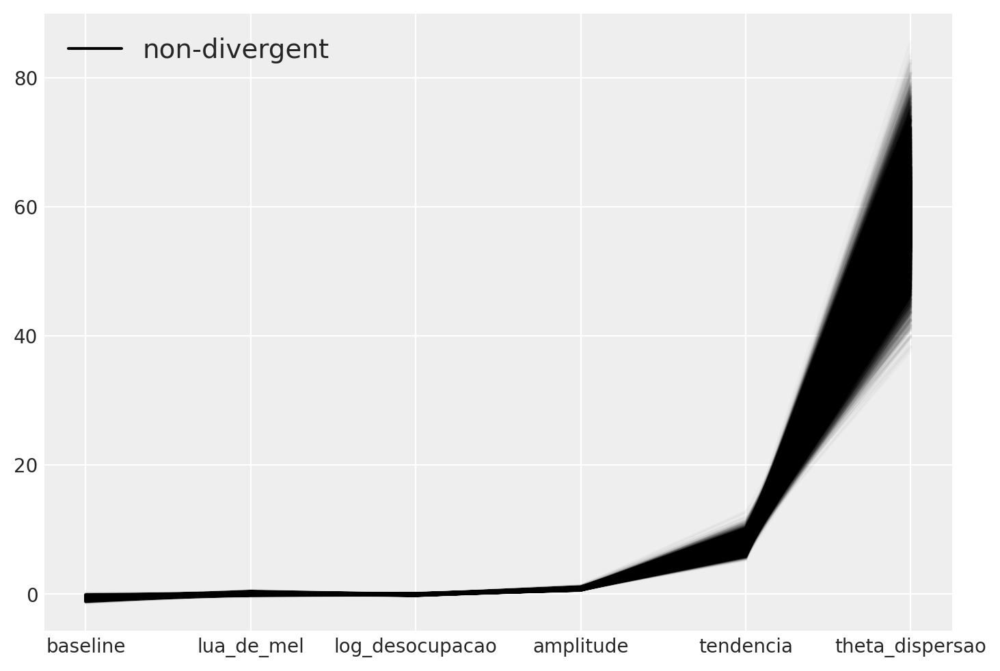

In [14]:
# hide
az.plot_parallel(trace_desocupacao, var_names=["~delta_desocupacao", "~popularidade", "~gp_tempo", "~gp_tempo_rotated_", "theta_dispersao"]);

## Prevendo a popularidade -- Eu vejo o futuro!

In [15]:
az.summary(
    trace_desocupacao, var_names=["~delta_desocupacao", "~popularidade", "~gp_tempo", "~gp_tempo_rotated_"], round_to=2
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline,-0.63,0.18,-0.95,-0.29,0.00,0.00,14378.71,11997.89,1.00
lua_de_mel,0.08,0.11,-0.13,0.28,0.00,0.00,32134.83,11640.79,1.00
log_desocupacao,-0.08,0.06,-0.18,0.03,0.00,0.00,25018.03,12398.07,1.00
amplitude,0.79,0.09,0.62,0.96,0.00,0.00,7507.47,10861.25,1.00
tendencia,7.76,0.86,6.20,9.36,0.01,0.01,5983.33,9704.55,1.00
theta_dispersao,59.28,6.66,47.21,72.14,0.06,0.04,13698.63,11946.73,1.00


In [16]:
from scipy.special import expit as logistic

logistic(-0.64).round(2)

0.35

In [17]:
from scipy.special import expit as logistic

logistic(0.08).round(2)

0.52

In [18]:
from scipy.special import expit as logistic

logistic(-0.14).round(2)

0.47

In [19]:
MAX_OBSERVACAO = len(df.index)
OOS_MESES = 3  # 1 quarter out-of-sample
# to solve the missmatch os sizes I'm adding -1 
MAX_TEMPO = MAX_OBSERVACAO + OOS_MESES

oos_tempo = np.linspace(0, MAX_TEMPO, MAX_TEMPO)[:, None]


In [20]:
log_desocupacao = np.log(df.desocupacao)


def generate_oos_desocupacao_data(center: float, oos_meses: int) -> np.ndarray:
    """
    Generate out-of-sample unemployment data around `center` and for `oos_months`.
    """
    # unemployment is around `center`
    ppc_desocupacao = np.random.normal(
        loc=center,
        scale=df.desocupacao.std(),
        size=oos_meses // 3,
    )
    # data only observed quarterly, so need to forward-fill
    ppc_desocupacao = np.repeat(ppc_desocupacao, repeats=3)

    # log data and scale
    stdz_log_ppc_desocupacao = (np.log(ppc_desocupacao) - log_desocupacao.mean()) / log_desocupacao.std()

    # add noise around values
    return stdz_log_ppc_desocupacao + np.random.normal(
        loc=trace_desocupacao.posterior["delta_desocupacao"].mean(),
        scale=trace_desocupacao.posterior["delta_desocupacao"].std(),
        size=OOS_MESES,
    )

In [21]:
# unemployment stays around last value
oos_desocupacao = generate_oos_desocupacao_data(
    center=df.desocupacao.iloc[-1], oos_meses=OOS_MESES
)

oos_desocupacao

array([1.33996283, 1.27611776, 1.53506406])

In [22]:
PREDICTION_COORDS = {
    "temporal": pd.date_range(
        start=COORDS["temporal"][0],
        end=COORDS["temporal"][-1] + pd.DateOffset(months=OOS_MESES) + pd.tseries.offsets.MonthEnd(0), 
        freq="M",
    )
}


with desocupacao_latent_gp:
    pm.set_data(
        {
            "mandato": np.concatenate(
                (
                    df.mandato.values,
                    np.zeros(OOS_MESES, dtype=int),
                )
            ),
            "stdz_log_desocupacao": np.concatenate(
                (standardize(log_desocupacao).values, oos_desocupacao)
            ),
        }
    )
    gp_tempo_novo = gp.conditional("gp_tempo_novo", Xnew=oos_tempo)

    ppc = pm.sample_posterior_predictive(
        trace_desocupacao.posterior,
        samples=1000,
        var_names=["baseline", "gp_tempo_novo", "lua_de_mel", "log_desocupacao"],
    )

    az.from_pymc3_predictions(
        ppc,
        idata_orig=trace_desocupacao,
        inplace=True,
        coords=PREDICTION_COORDS,
        dims={"gp_tempo_novo": ["temporal"]},
    )


In [36]:
# hide
az.to_netcdf(trace_desocupacao, "../data/projecoes/desocupacao_trace_bruto.nc")

'../data/projecoes/desocupacao_trace_bruto.nc'

In [25]:
def compute_post_pred_approval(
    desocupacao_oos: xr.DataArray = trace_desocupacao.predictions_constant_data[
        "stdz_log_desocupacao"
    ],
) -> xr.DataArray:
    from scipy.special import expit as logistic
    """
    Compute job approval from posterior predictive samples.

    unemp_oos: out-of-sample values for unemployment.
    Defaults to the values stored in the `InferenceData.predictions_constant_data`
    group, i.e unemployment stays around last value.
    """
    return logistic(
        trace_desocupacao.predictions["baseline"]
        + trace_desocupacao.predictions["gp_tempo_novo"]
        + trace_desocupacao.predictions["lua_de_mel"]
        * trace_desocupacao.predictions_constant_data["mandato"]
        + trace_desocupacao.predictions["log_desocupacao"] * desocupacao_oos
    )

In [26]:
pp_prop_atual = compute_post_pred_approval()

pp_prop_atual

<xarray.DataArray (chain: 1, draw: 1000, temporal: 324)>
array([[[0.54410677, 0.50969718, 0.47482417, ..., 0.2421231 ,
         0.26800905, 0.28251987],
        [0.5933366 , 0.50706917, 0.48371605, ..., 0.38978414,
         0.42232183, 0.42345608],
        [0.56746317, 0.52653598, 0.48486077, ..., 0.33476341,
         0.3560845 , 0.36714184],
        ...,
        [0.64447568, 0.54152186, 0.45790439, ..., 0.11109916,
         0.09059171, 0.07843733],
        [0.46908562, 0.46371122, 0.46286322, ..., 0.28327112,
         0.29430923, 0.29546167],
        [0.51605307, 0.47536391, 0.44289328, ..., 0.32577685,
         0.31868432, 0.28697299]]])
Coordinates:
  * chain     (chain) int64 0
  * draw      (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999
  * temporal  (temporal) datetime64[ns] 1995-01-31 1995-02-28 ... 2021-12-31

In [34]:
# desemprego centrado em 10%
oos_desocupacao_10 = generate_oos_desocupacao_data(center=9.5, oos_meses=OOS_MESES)


pp_prop_baixo = compute_post_pred_approval(
    desocupacao_oos=xr.DataArray(
        np.concatenate((standardize(log_desocupacao).values, oos_desocupacao_10)),
        dims=["temporal"],
        coords=PREDICTION_COORDS,
    )
)

print(oos_desocupacao_10)


# desemprego centrado em 19%
oos_desocupacao_19 = generate_oos_desocupacao_data(center=23.0, oos_meses=OOS_MESES)


pp_prop_alto = compute_post_pred_approval(
    desocupacao_oos=xr.DataArray(
        np.concatenate((standardize(log_desocupacao).values, oos_desocupacao_19)),
        dims=["temporal"],
        coords=PREDICTION_COORDS,
    )
)

print(oos_desocupacao_19)

[-0.39510414 -0.2798664  -0.40003327]
[3.36132761 3.42882074 3.4744196 ]


In [28]:
# hide
raw_polls = all_presidents.loc[all_presidents.index >= pd.to_datetime("1995-01-15")]

raw_polls

,empresa,positiva,regular,negativa,amostra,erro,nsnr,presidente,modo
data_fim,,,,,,,,,
1995-01-15,Projeção,0.57,0.23,0.09,1000,3.00,10.00,Fernando Henrique I,Presencial
1995-02-07,Sensus,0.57,0.23,0.09,1000,2.00,10.00,Fernando Henrique I,Presencial
1995-02-07,Vox Populi,0.57,0.23,0.09,2000,3.00,10.00,Fernando Henrique I,Presencial
1995-03-13,Sensus,0.43,0.40,0.11,1000,2.00,6.00,Fernando Henrique I,Presencial
1995-03-13,Vox Populi,0.43,0.40,0.11,2000,3.00,6.00,Fernando Henrique I,Presencial
...,...,...,...,...,...,...,...,...,...
2021-09-15,PoderData,0.27,0.14,0.56,2500,2.00,3.00,Jair Bolsonaro,IVR
2021-09-20,Ipec,0.22,0.23,0.53,2002,2.00,1.00,Jair Bolsonaro,Presencial
2021-09-20,Ranking Brasil,0.28,0.17,0.53,4000,2.50,2.20,Jair Bolsonaro,CATI


In [37]:
# hide
# save data for Bokeh plot
az.to_netcdf(trace_desocupacao.predictions, "../data/projecoes/desocupacao_trace_predicoes.nc")

pp_prop_atual.to_dataset(name="post_pred_pos").to_netcdf(
    "../data/projecoes/desocupacao_post_pred_pos.nc"
)
pp_prop_baixo.to_dataset(name="post_pred_pos_baixo").to_netcdf(
    "../data/projecoes/desocupacao_post_pred_pos_10.nc"
)
pp_prop_alto.to_dataset(name="post_pred_pos_alto").to_netcdf(
    "../data/projecoes/desocupacao_post_pred_pos_19.nc"
)

raw_polls.to_csv("../data/raw_polls.csv")

pd.DataFrame.from_dict(PREDICTION_COORDS).to_csv("../data/projecoes/desocupacao_prediction_coords.csv")

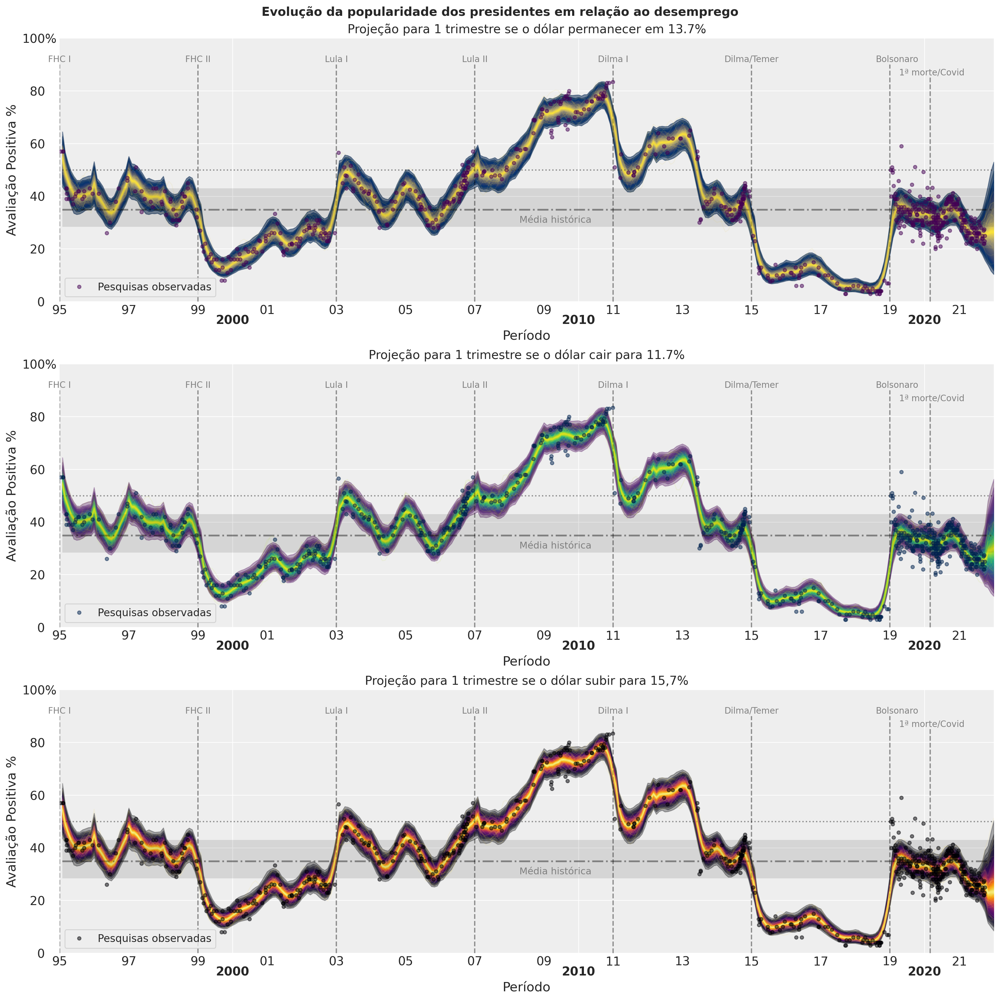

In [38]:
from scipy.special import expit as logistic

# collapse
_, (top, mid, low) = plt.subplots(
    3, 1, figsize=(16, 16), constrained_layout=True, sharey=True
)

pp_dates = pd.date_range(
    start=df.index[0] - np.timedelta64(0, "M"),
    periods=MAX_TEMPO,
    freq="M",
).values

# plot the samples from the gp posterior with samples and shading
pm.gp.util.plot_gp_dist(
    top,
    pp_prop_atual.stack(sample=("chain", "draw")).data.T,
    pp_dates,
    plot_samples=True,
    palette="cividis",
    fill_alpha=0.5,
)
pm.gp.util.plot_gp_dist(
    mid,
    pp_prop_baixo.stack(sample=("chain", "draw")).data.T,
    pp_dates,
    plot_samples=True,
    palette="viridis",
    fill_alpha=0.3,
)
pm.gp.util.plot_gp_dist(
    low,
    pp_prop_alto.stack(sample=("chain", "draw")).data.T,
    pp_dates,
    plot_samples=True,
    palette="inferno",
    fill_alpha=0.3,
)

for ax, cmap, title in zip(
    (top, mid, low),
    (plt.cm.viridis(0), plt.cm.cividis(0), plt.cm.inferno(0)),
    (f"permanecer em {df.desocupacao.iloc[-1].round(1)}%", "cair para 11.7%", "subir para 15,7%"),
):
    # plot data
    ax.plot(
        raw_polls.index,
        raw_polls.positiva.values,
        "o",
        ms=4,
        color=cmap,
        alpha=0.5,
        label="Pesquisas observadas",
    )

    # plot historical baseline
    ax.hlines(
        logistic(trace_desocupacao.predictions["baseline"].mean()),
        pp_dates[0],
        pp_dates[-1],
        "k",
        "-.",
        alpha=0.4,
        lw=2,
    )
    ax.fill_between(
        pp_dates,
        logistic(az.hdi(trace_desocupacao.predictions)["baseline"]).sel(hdi="lower"),
        logistic(az.hdi(trace_desocupacao.predictions)["baseline"]).sel(hdi="higher"),
        color="k",
        edgecolor="none",
        alpha=0.1,
    )
    ax.text(
        pd.to_datetime("2009-05-01"),
        0.3,
        "Média histórica",
        fontsize=11,
        color="grey",
        horizontalalignment="center",
    )

    # annotate graph
    ax.hlines(
        0.5,
        pp_dates[0],
        pp_dates[-1],
        "k",
        ":",
        alpha=0.4,
    )

    ax.vlines(pd.to_datetime("1995-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("1995-01-01"),
        0.91,
        "FHC I",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("1999-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("1999-01-01"),
        0.91,
        "FHC II",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("2003-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2003-01-01"),
        0.91,
        "Lula I",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("2007-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2007-01-01"),
        0.91,
        "Lula II",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("2011-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2011-01-01"),
        0.91,
        "Dilma I",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )
    
    ax.vlines(pd.to_datetime("2015-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2015-01-01"),
        0.91,
        "Dilma/Temer",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("2019-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2019-03-17"),
        0.91,
        "Bolsonaro",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )
    
    ax.vlines(pd.to_datetime("2020-03-01"), 0.0, 0.85, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2020-03-17"),
        0.86,
        "1ª morte/Covid",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    # axis labels and title
    ax.set_ylim((0, 1))
    ax.set_xlabel("Período")
    ax.set_ylabel("Avaliação Positiva %")
    ax.set_title(
        f"Projeção para 1 trimestre se o dólar {title}",
        fontsize=14,
    )
    ax.legend(fontsize=12, loc="lower left", frameon=True)
    ax.set_yticklabels(labels = ['0   ', '20   ', '40   ', '60   ', '80   ', '100%'])
    # Define the date format
    plt.setp(ax.get_xmajorticklabels(), rotation=0, weight="bold", ha="center")
    ax.set_xlim(pd.datetime(1995,1,1), pd.datetime(2022,1,1))
    format_xaxis(ax)


plt.suptitle(
    "Evolução da popularidade dos presidentes em relação ao desemprego",
    fontsize=14,
    fontweight="bold",
)
plt.savefig("../figures/gp-desocupacao_popularidade")

In [ ]:
# hide_input
%load_ext watermark
%watermark -a @dmarcelinobr -n -u -v -iv